In [1]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import scipy.io.wavfile as wave

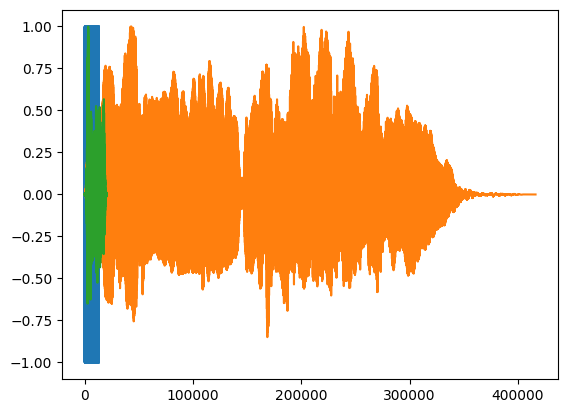

In [6]:
fsroy, roy = wave.read('../04-Spectral-Chromogram-Motiongram/data/roy.wav')
roy = roy / np.max(np.abs(roy))

fssinusoids, sinusoids = wave.read('../04-Spectral-Chromogram-Motiongram/data/changingSinusoids.wav')
sinusoids = sinusoids / np.max(np.abs(sinusoids))

fsTrumpet, trumpet = wave.read('../04-Spectral-Chromogram-Motiongram/data/trumpetFull.wav')
trumpet = trumpet / np.max(np.abs(trumpet))

plt.plot(sinusoids)
plt.plot(trumpet)
plt.plot(roy)

plt.show()

In [28]:
def plot_spectrum(x, title, fft_length=2048, window_type="hann", window_length=None, hop=None):
    D = librosa.stft(x, n_fft=fft_length,
                      hop_length=hop,
                      win_length=window_length,
                      window=window_type)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    img = librosa.display.specshow(S_db, x_axis='time', y_axis='linear')
    plt.colorbar(img, format="%+2.f dB")
    plt.title(title)

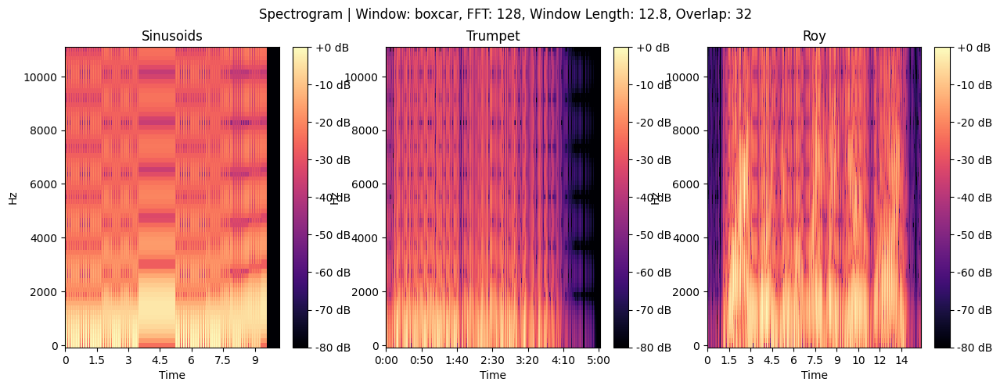

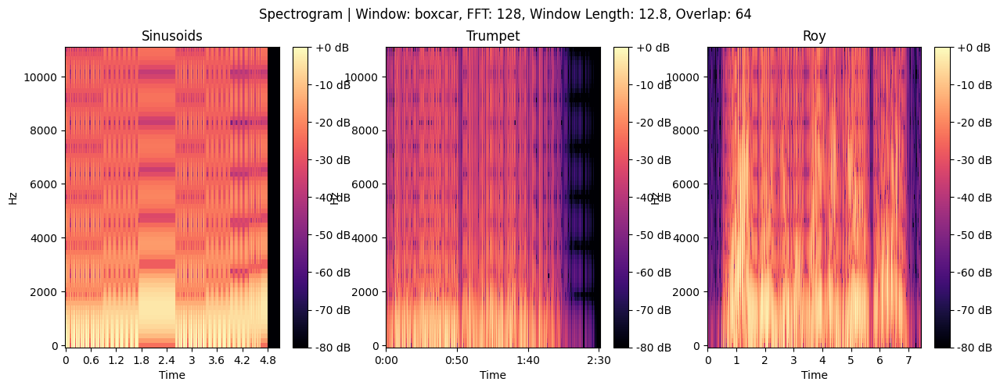

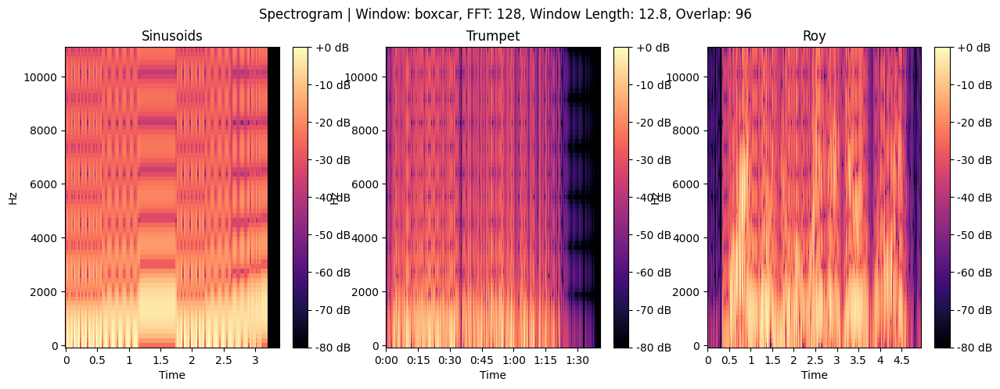

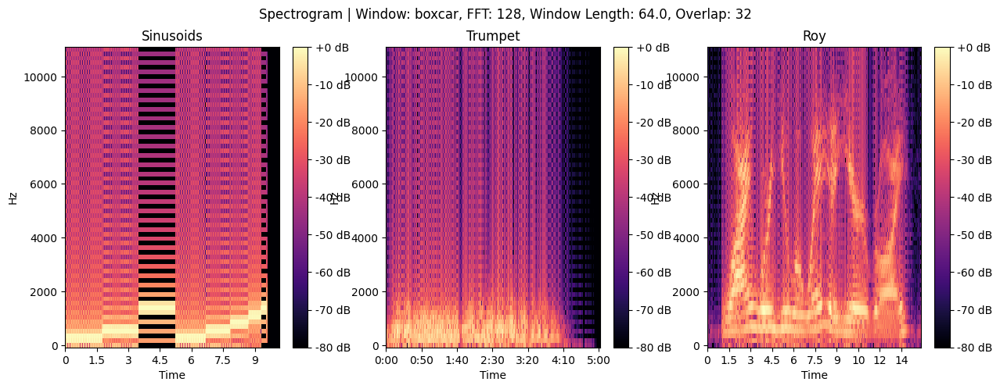

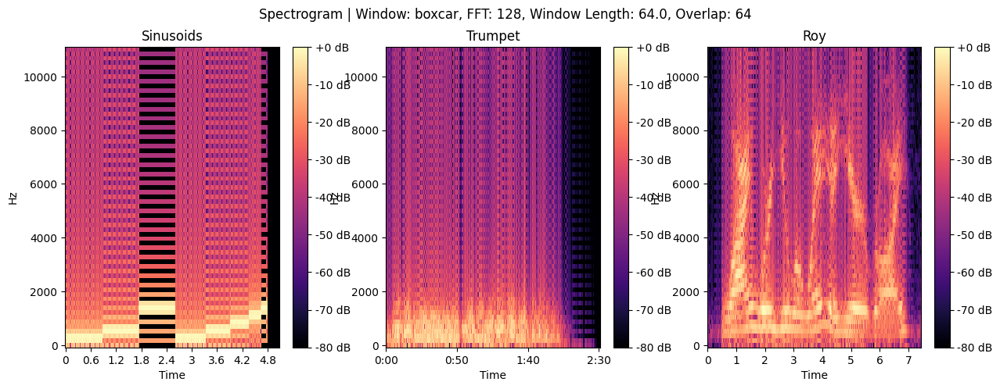

...

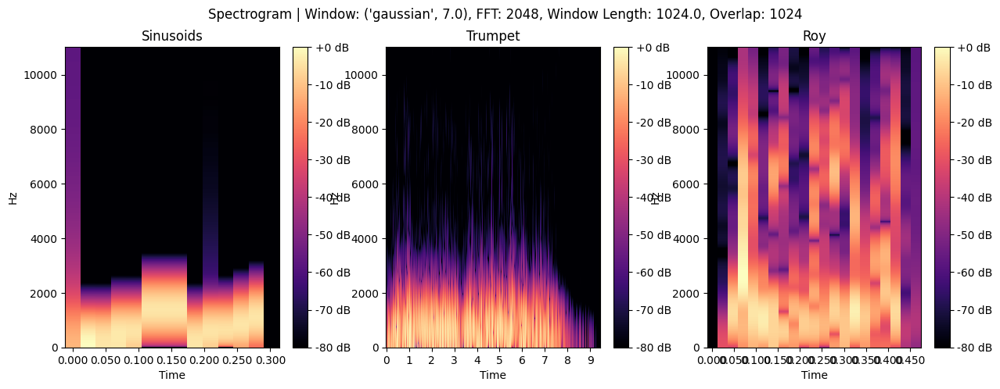

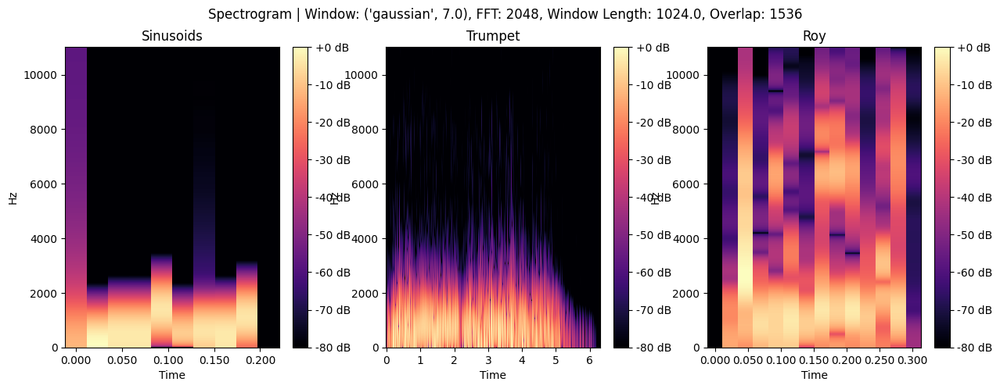

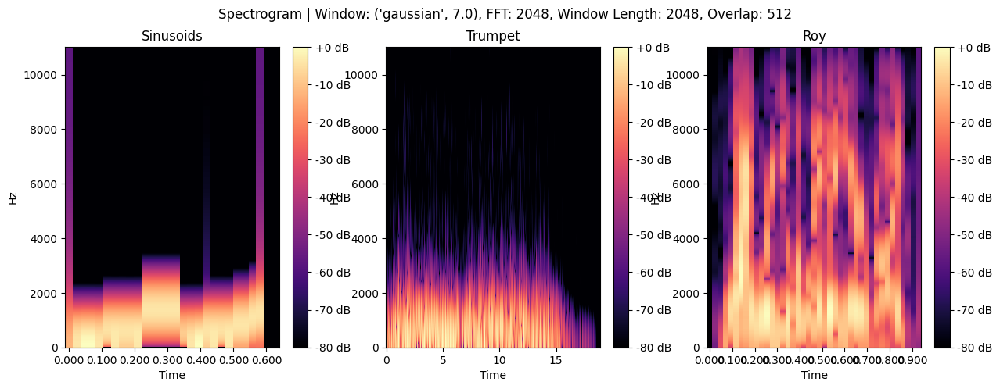

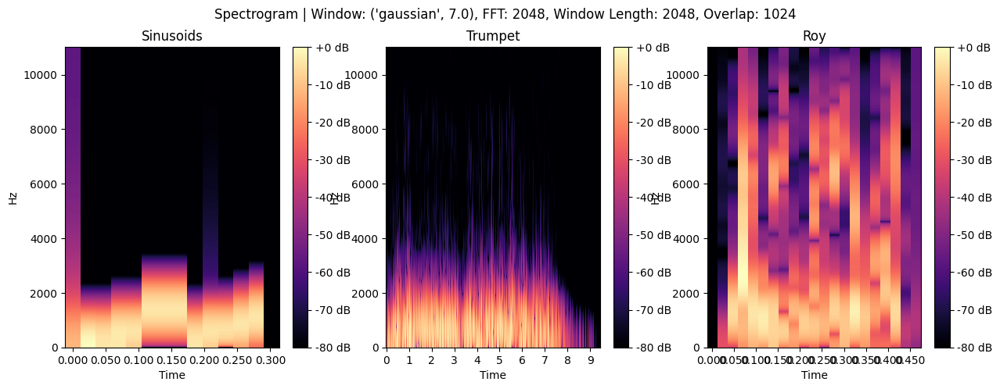

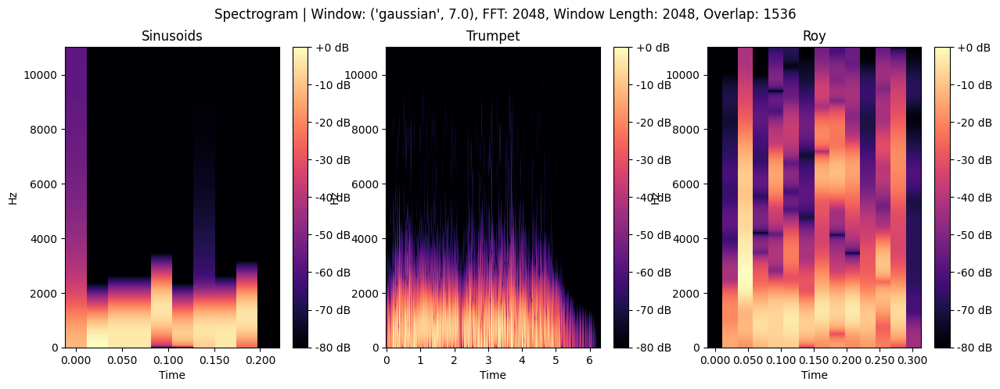

In [36]:
window_types = ['boxcar', 'hann', ('gaussian', 7.0)]
fft_n = [128, 512, 2048]
window_len = [0.1, 0.5, 1] # percent of fft_n
overlap = [0.25, 0.5, 0.75]


for window in window_types:
    for n in fft_n:
        for l in window_len:
            for o in overlap:
                plt.figure(figsize=(15, 5))
                plt.subplot(1, 3, 1)
                plot_spectrum(sinusoids, "Sinusoids", fft_length=n, window_type=window, window_length=int(n*l), hop=int(n*o))
                
                plt.subplot(1, 3, 2)
                plot_spectrum(trumpet, "Trumpet", fft_length=n, window_type=window, window_length=int(n*l), hop=int(n*o))

                plt.subplot(1, 3, 3)
                plot_spectrum(roy, "Roy", fft_length=n, window_type=window, window_length=int(n*l), hop=int(n*o))

                plt.suptitle("Spectrogram | Window: {}, FFT: {}, Window Length: {}, Overlap: {}".format(window, n, n*l, int(n*o)))
                plt.show()